# Instal extension Kaggle

In [1]:
! pip install -q kaggle

In [2]:
from google.colab import files

** Upload Credential Account Kaggle **

In [3]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"dhayat","key":"14b4f1ee8dc2fe06a1e55391c89d54f8"}'}

In [4]:
! mkdir ~/.kaggle

In [5]:
! cp kaggle.json ~/.kaggle/

In [6]:
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
! kaggle datasets list

ref                                                               title                                                 size  lastUpdated          downloadCount  
----------------------------------------------------------------  --------------------------------------------------  ------  -------------------  -------------  
christianlillelund/donald-trumps-rallies                          Donald Trump's Rallies                               720KB  2020-09-26 10:25:08            709  
heeraldedhia/groceries-dataset                                    Groceries dataset                                    257KB  2020-09-17 04:36:08           3344  
andrewmvd/trip-advisor-hotel-reviews                              Trip Advisor Hotel Reviews                             5MB  2020-09-30 08:31:20           1909  
balraj98/stanford-background-dataset                              Stanford Background Dataset                           17MB  2020-09-26 12:57:59            199  
nehaprabhavalkar/india

**Download Datasets Dari Kaggle**

In [8]:
! kaggle datasets download -d kmader/skin-cancer-mnist-ham10000

100% 5.19G/5.20G [01:55<00:00, 31.7MB/s]
100% 5.20G/5.20G [01:55<00:00, 48.4MB/s]


In [9]:
! mkdir skin_cancer

In [10]:
! unzip skin-cancer-mnist-ham10000.zip -d skin_cancer

Streaming output truncated to the last 5000 lines.
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029326.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029327.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029328.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029329.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029330.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029331.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029332.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029333.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029334.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029335.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029336.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029337.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029338.jpg  
  inflating: skin_cancer/ham10000_images_part_2/ISIC_0029339.jpg  
  inflating

In [11]:
!rm -r /content/skin_cancer/ham10000_images_part_1
!rm -r /content/skin_cancer/ham10000_images_part_2

# Library

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
np.random.seed(123)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import confusion_matrix
import itertools

import keras
from keras.utils.np_utils import to_categorical # used for converting labels to one-hot-encoding
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras import backend as K
import itertools
from keras.layers.normalization import BatchNormalization
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding

from keras.optimizers import Adam, SGD
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import train_test_split

In [13]:
#1. Function to plot model's validation loss and validation accuracy
def plot_model_history(model_history):
    fig, axs = plt.subplots(1,2,figsize=(15,5))
    # summarize history for accuracy
    axs[0].plot(range(1,len(model_history.history['accuracy'])+1),model_history.history['accuracy'])
    axs[0].plot(range(1,len(model_history.history['val_accuracy'])+1),model_history.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_xticks(np.arange(1,len(model_history.history['accuracy'])+1),len(model_history.history['accuracy'])/10)
    axs[0].legend(['train', 'val'], loc='best')
    # summarize history for loss
    axs[1].plot(range(1,len(model_history.history['loss'])+1),model_history.history['loss'])
    axs[1].plot(range(1,len(model_history.history['val_loss'])+1),model_history.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_xticks(np.arange(1,len(model_history.history['loss'])+1),len(model_history.history['loss'])/10)
    axs[1].legend(['train', 'val'], loc='best')
    plt.show()

# Load Image dari Directory

In [14]:
dataset_dir = os.path.join('..', '/content/skin_cancer')

# Merging images from both folders HAM10000_images_part1.zip and HAM10000_images_part2.zip into one dictionary

imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(dataset_dir, '*', '*.jpg'))}

# This dictionary is useful for displaying more human-friendly labels later on

lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

In [15]:
skin_df = pd.read_csv(os.path.join(dataset_dir, 'HAM10000_metadata.csv'))

# Creating New Columns for better readability

skin_df['path'] = skin_df['image_id'].map(imageid_path_dict.get)
skin_df['cell_type'] = skin_df['dx'].map(lesion_type_dict.get) 
skin_df['cell_type_idx'] = pd.Categorical(skin_df['cell_type']).codes
# Now lets see the sample of tile_df to look on newly made columns
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,/content/skin_cancer/HAM10000_images_part_2/IS...,Benign keratosis-like lesions,2


## Data Cleaning

In [16]:
skin_df.isnull().sum()

lesion_id         0
image_id          0
dx                0
dx_type           0
age              57
sex               0
localization      0
path              0
cell_type         0
cell_type_idx     0
dtype: int64

In [17]:
skin_df['age'].fillna((skin_df['age'].mean()), inplace=True)

In [18]:
skin_df.isnull().sum()

lesion_id        0
image_id         0
dx               0
dx_type          0
age              0
sex              0
localization     0
path             0
cell_type        0
cell_type_idx    0
dtype: int64

In [19]:
skin_df.dtypes

lesion_id         object
image_id          object
dx                object
dx_type           object
age              float64
sex               object
localization      object
path              object
cell_type         object
cell_type_idx       int8
dtype: object

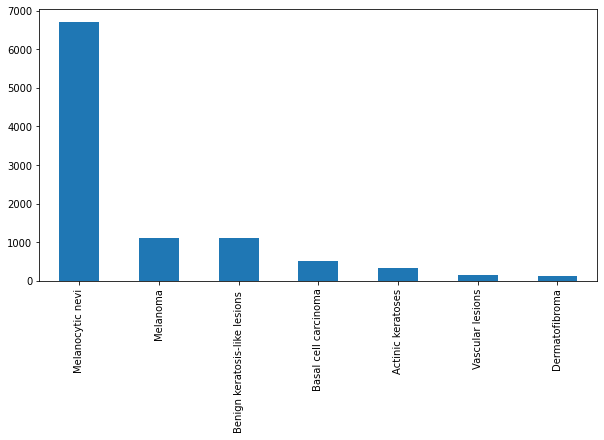

In [20]:
fig, ax1 = plt.subplots(1, 1, figsize= (10, 5))
skin_df['cell_type'].value_counts().plot(kind='bar', ax=ax1)


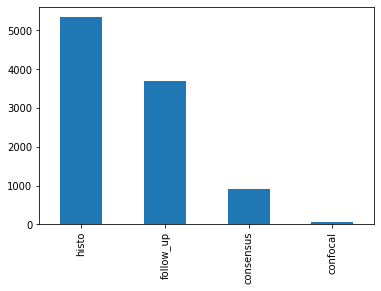

In [21]:
skin_df['dx_type'].value_counts().plot(kind='bar')

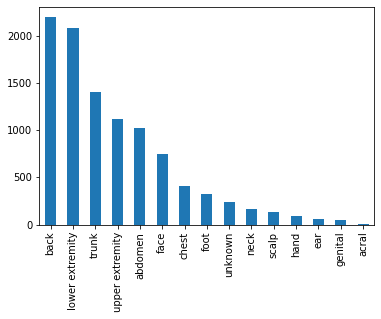

In [22]:
skin_df['localization'].value_counts().plot(kind='bar')

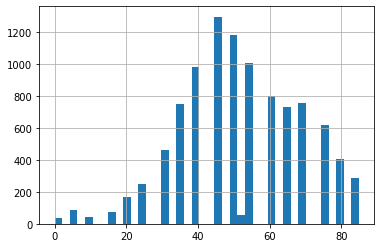

In [23]:
skin_df['age'].hist(bins=40)

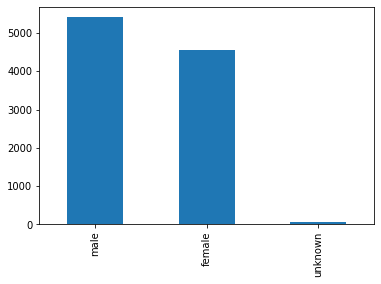

In [24]:
skin_df['sex'].value_counts().plot(kind='bar')

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


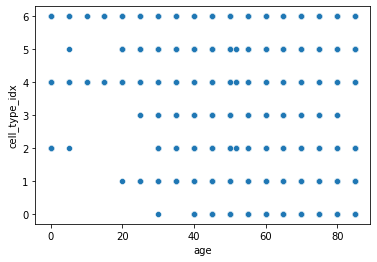

In [25]:
sns.scatterplot('age','cell_type_idx',data=skin_df)

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3704: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


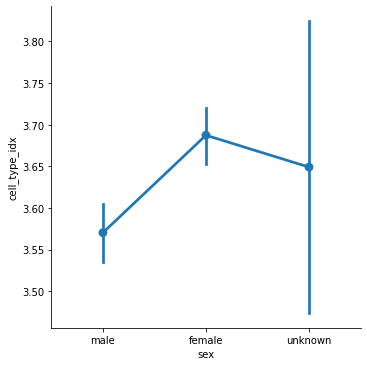

In [26]:
sns.factorplot('sex','cell_type_idx',data=skin_df)

In [28]:
skin_df['image'] = skin_df['path'].map(lambda x: np.asarray(Image.open(x).resize((100,75))))

In [29]:
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx,image
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2,"[[[190, 153, 194], [192, 154, 196], [191, 153,..."
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2,"[[[23, 13, 22], [24, 14, 24], [25, 14, 28], [3..."
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2,"[[[185, 127, 137], [189, 133, 147], [194, 136,..."
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,/content/skin_cancer/HAM10000_images_part_1/IS...,Benign keratosis-like lesions,2,"[[[24, 11, 17], [26, 13, 22], [38, 21, 32], [5..."
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,/content/skin_cancer/HAM10000_images_part_2/IS...,Benign keratosis-like lesions,2,"[[[134, 90, 113], [147, 102, 125], [159, 115, ..."


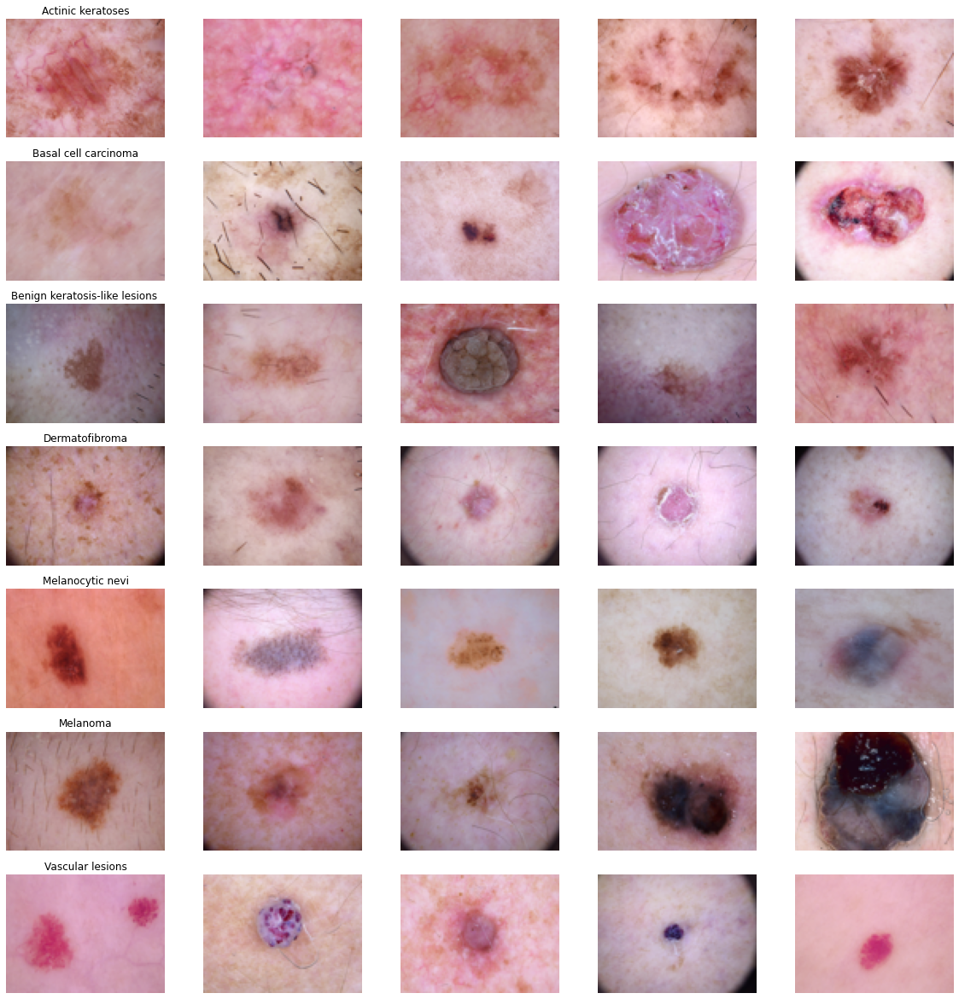

In [30]:
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         skin_df.sort_values(['cell_type']).groupby('cell_type')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')
fig.savefig('category_samples.png', dpi=300)

In [31]:
# Checking the image size distribution
skin_df['image'].map(lambda x: x.shape).value_counts()

(75, 100, 3)    10015
Name: image, dtype: int64

# Feature Engineering

In [32]:
features=skin_df.drop(columns=['cell_type_idx'],axis=1)
target=skin_df['cell_type_idx']

In [33]:
x_train_o, x_test_o, y_train_o, y_test_o = train_test_split(features, target, test_size=0.20,random_state=1234)

In [34]:
x_train = np.asarray(x_train_o['image'].tolist())
x_test = np.asarray(x_test_o['image'].tolist())

x_train_mean = np.mean(x_train)
x_train_std = np.std(x_train)

x_test_mean = np.mean(x_test)
x_test_std = np.std(x_test)

x_train = (x_train - x_train_mean)/x_train_std
x_test = (x_test - x_test_mean)/x_test_std

In [35]:
# Perform one-hot encoding on the labels
y_train = to_categorical(y_train_o, num_classes = 7)
y_test = to_categorical(y_test_o, num_classes = 7)

In [36]:
x_train, x_validate, y_train, y_validate = train_test_split(x_train, y_train, test_size = 0.2, random_state = 2)

In [37]:
# Reshape image in 3 dimensions (height = 75px, width = 100px , canal = 3)
x_train = x_train.reshape(x_train.shape[0], *(75, 100, 3))
x_test = x_test.reshape(x_test.shape[0], *(75, 100, 3))
x_validate = x_validate.reshape(x_validate.shape[0], *(75, 100, 3))

# Model CNN

In [38]:
# Set the CNN model 

input_shape = (75, 100, 3)
num_classes = 7

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',padding = 'Same',input_shape=input_shape))
model.add(Conv2D(32,kernel_size=(3, 3), activation='relu',padding = 'Same',))
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu',padding = 'Same'))
model.add(Conv2D(64, (3, 3), activation='relu',padding = 'Same'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.40))

model.add(Conv2D(128, (3, 3), activation='relu',padding = 'Same'))
model.add(Conv2D(128, (3, 3), activation='relu',padding = 'Same'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.50))

model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 75, 100, 32)       896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 75, 100, 32)       9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 37, 50, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 37, 50, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 37, 50, 64)        18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 37, 50, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 18, 25, 64)        0

In [39]:
# Define the optimizer
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
# optimizer = SGD(lr=0.001, momentum=0.9)

In [40]:
# Compile the model
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])

In [41]:
# Set a learning rate annealer
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

In [42]:
# With data augmentation to prevent overfitting 

datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images

datagen.fit(x_train)

In [43]:
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot

# Menampilkan Hasil Data Augmentation

untuk:  Random Horizontal Shift


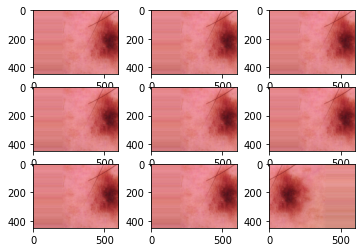

untuk:  Random Vertical Shift


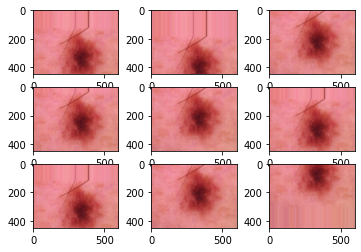

untuk:  Random horizontal Flip


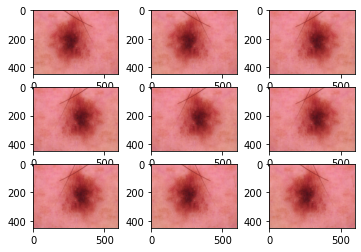

untuk:  Random Rotation Augmentation


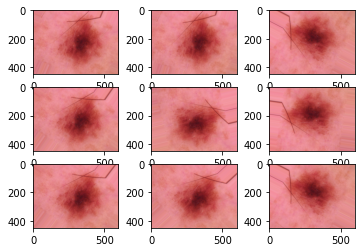

untuk:  Random Brightness Augmentation


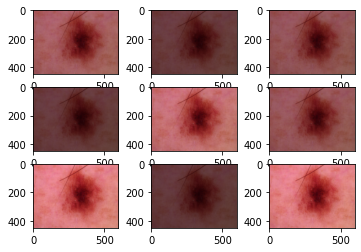

untuk:  Random Zoom Augmentation


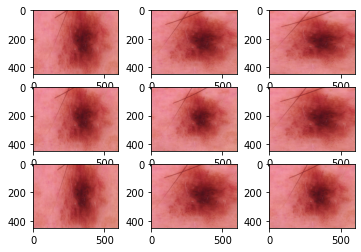

In [44]:
def parameter(prm):
  img = load_img('/content/skin_cancer/HAM10000_images_part_1/ISIC_0024306.jpg')
  data = img_to_array(img)
  samples = expand_dims(data, 0)
  datagen2 = (prm)
  it = datagen2.flow(samples, batch_size=1)
  for i in range(9):
    pyplot.subplot(330 + 1 + i)
    batch = it.next()
    image = batch[0].astype('uint8')
    pyplot.imshow(image)
  pyplot.show()
param=[ImageDataGenerator(width_shift_range=[-200,200]),ImageDataGenerator(height_shift_range=0.5),ImageDataGenerator(horizontal_flip=True),ImageDataGenerator(rotation_range=90),ImageDataGenerator(brightness_range=[0.2,1.0]),ImageDataGenerator(zoom_range=[0.5,1.0])]
name=['Random Horizontal Shift','Random Vertical Shift','Random horizontal Flip','Random Rotation Augmentation','Random Brightness Augmentation','Random Zoom Augmentation']

for i in range(len(name)):
  print('untuk: ',name[i])
  parameter(param[i])

In [45]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Set Checkpoint

In [46]:
filepath='skincancer.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

In [47]:
from tensorflow.keras.callbacks import TensorBoard
import os
import datetime

# Set Tensorboard

In [48]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # Tempat dimana log tensorboard akan di
callbacks_list.append(TensorBoard(logdir, histogram_freq=1))

# Running Model

In [49]:
# Fit the model
epochs = 100 
batch_size = 128
history = model.fit_generator(datagen.flow(x_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = (x_validate,y_validate),
                              verbose = 1, steps_per_epoch=x_train.shape[0] // batch_size
                              , callbacks=callbacks_list)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/100
 1/50 [..............................] - ETA: 0s - loss: 2.0146 - accuracy: 0.1250WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
50/50 [==============================] - ETA: 0s - loss: 1.1379 - accuracy: 0.6574
Epoch 00001: val_accuracy improved from -inf to 0.67311, saving model to skincancer.h5
50/50 [==============================] - 12s 233ms/step - loss: 1.1379 - accuracy: 0.6574 - val_loss: 1.0406 - val_accuracy: 0.6731
Epoch 2/100
50/50 [==============================] - ETA: 0s - loss: 0.9729 - accuracy: 0.6666
Epoch 00002: val_accuracy improved from 0.67311 to 0.67686, saving model to skincancer.h5
50/50 [==============================] - 11s 221ms/step - loss: 0

In [50]:
loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
loss_v, accuracy_v = model.evaluate(x_validate, y_validate, verbose=1)
print("Validation: accuracy = %f  ;  loss_v = %f" % (accuracy_v, loss_v))
print("Test: accuracy = %f  ;  loss = %f" % (accuracy, loss))
model.save("model.h5")

51/51 [==============================] - 0s 6ms/step - loss: 0.7436 - accuracy: 0.7748
Validation: accuracy = 0.774797  ;  loss_v = 0.743556
Test: accuracy = 0.783824  ;  loss = 0.724725


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


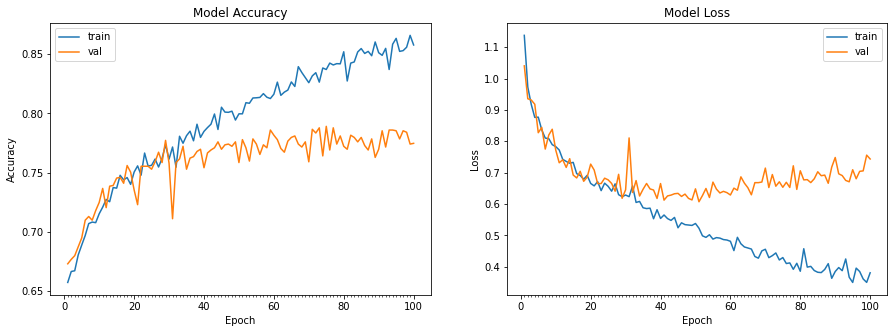

In [51]:
plot_model_history(history)

# Tampilan Tensorboard

In [52]:
%load_ext tensorboard

In [53]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# Saving Model

In [54]:
model_filename = "model.h5"

model.load_weights(model_filename)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [55]:
predictions = model.predict(x_validate)
predictions

array([[8.71393723e-13, 8.14445222e-09, 4.97758066e-08, ...,
        1.00000000e+00, 1.88950349e-08, 6.45825060e-11],
       [3.46930705e-07, 1.64024043e-03, 2.14197953e-05, ...,
        9.98331487e-01, 2.74795070e-06, 3.51930407e-06],
       [8.18916321e-01, 8.22744966e-02, 3.87127027e-02, ...,
        1.86407641e-02, 8.45219707e-04, 5.68405812e-06],
       ...,
       [2.58441831e-14, 1.58739368e-20, 6.41881270e-05, ...,
        9.92587864e-01, 7.34802568e-03, 9.56161231e-18],
       [1.68730594e-06, 9.68391802e-08, 8.25840328e-03, ...,
        6.97024167e-01, 2.94714153e-01, 3.88953993e-07],
       [2.33861530e-09, 7.00900393e-10, 4.38320467e-06, ...,
        9.90822196e-01, 9.17342585e-03, 1.11063985e-08]], dtype=float32)

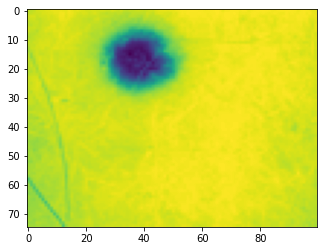

In [56]:
plt.imshow(x_validate[0][:,:,0]);

# Menampilkan Data yang terbaca pada Neuron per layer

In [57]:
from keras.models import Model
layer_outputs = [layer.output for layer in model.layers]
activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(x_train[10].reshape(1,75,100,3))
 
def display_activation(activations, col_size, row_size, act_index): 
    activation = activations[act_index]
    activation_index=0
    fig, ax = plt.subplots(row_size, col_size, figsize=(row_size*2.5,col_size*1.5))
    for row in range(0,row_size):
        for col in range(0,col_size):
            ax[row][col].imshow(activation[0, :, :, activation_index], cmap=None)
            activation_index += 1
        


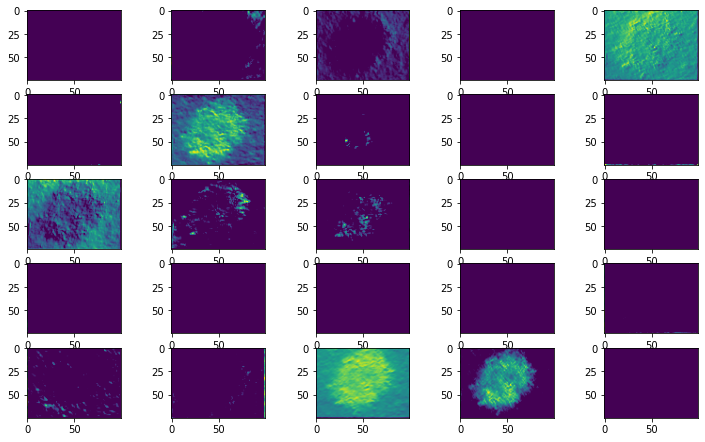

In [58]:
display_activation(activations, 5, 5, 0)

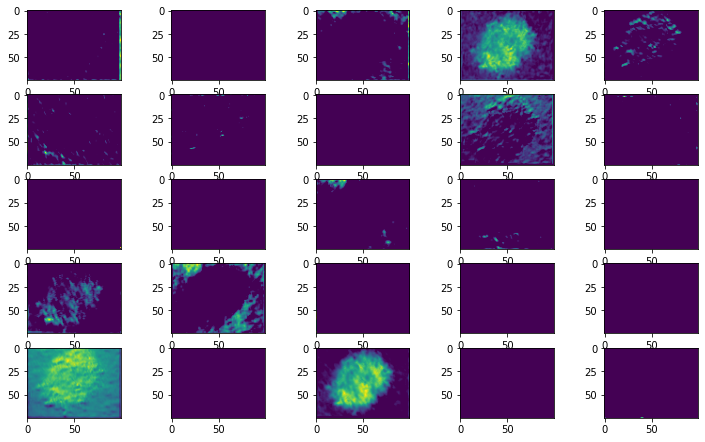

In [59]:
display_activation(activations, 5, 5, 1)

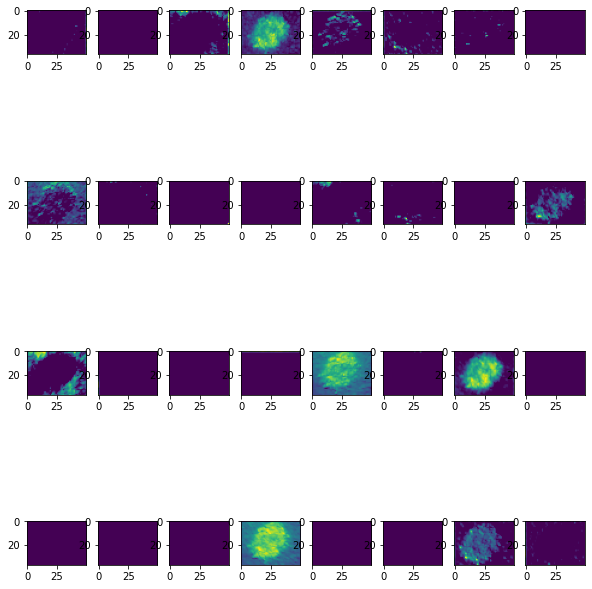

In [60]:
display_activation(activations, 8, 4, 3)

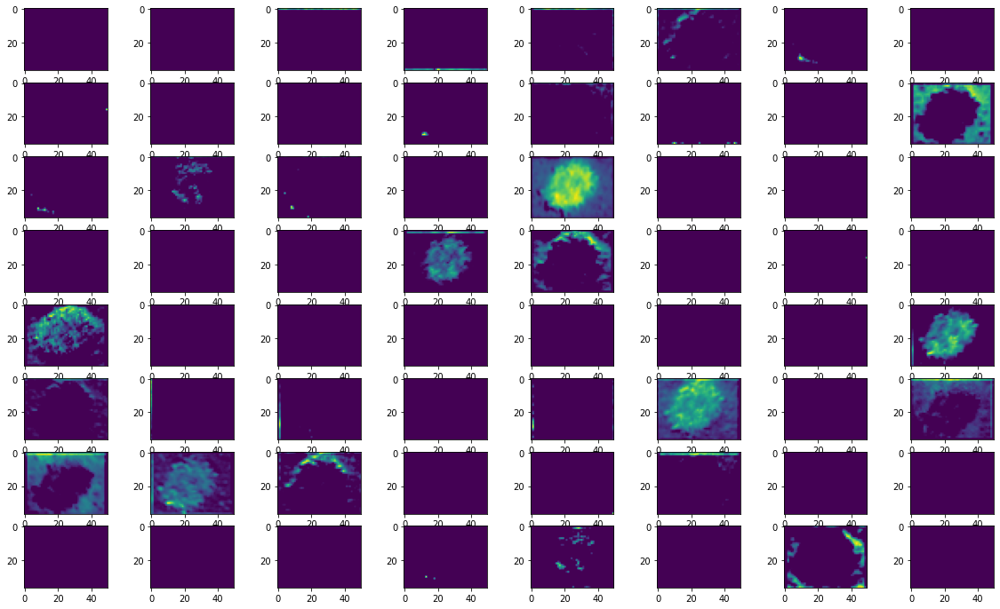

In [61]:
display_activation(activations, 8, 8, 4)

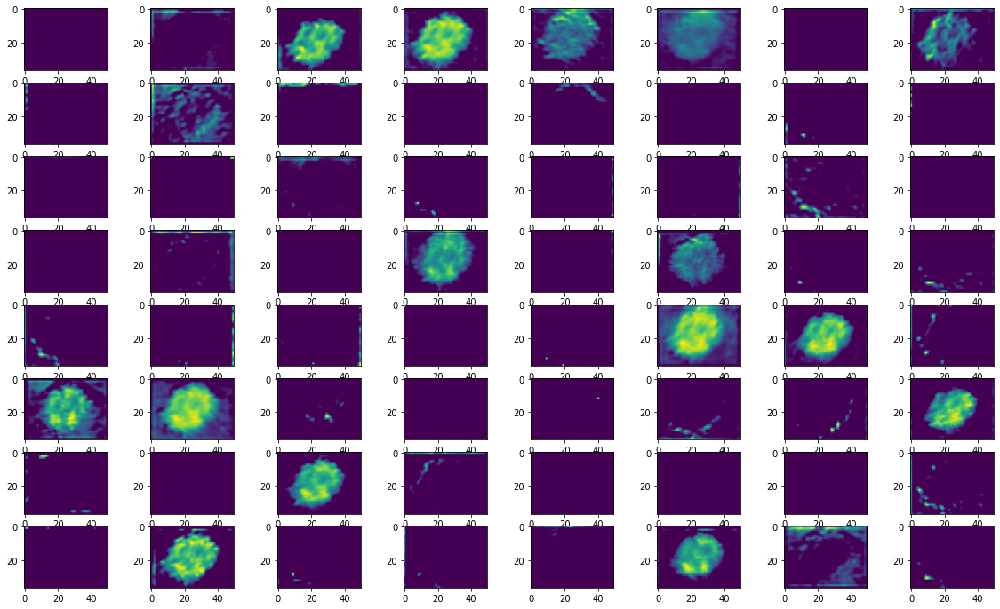

In [62]:
display_activation(activations, 8, 8, 5)

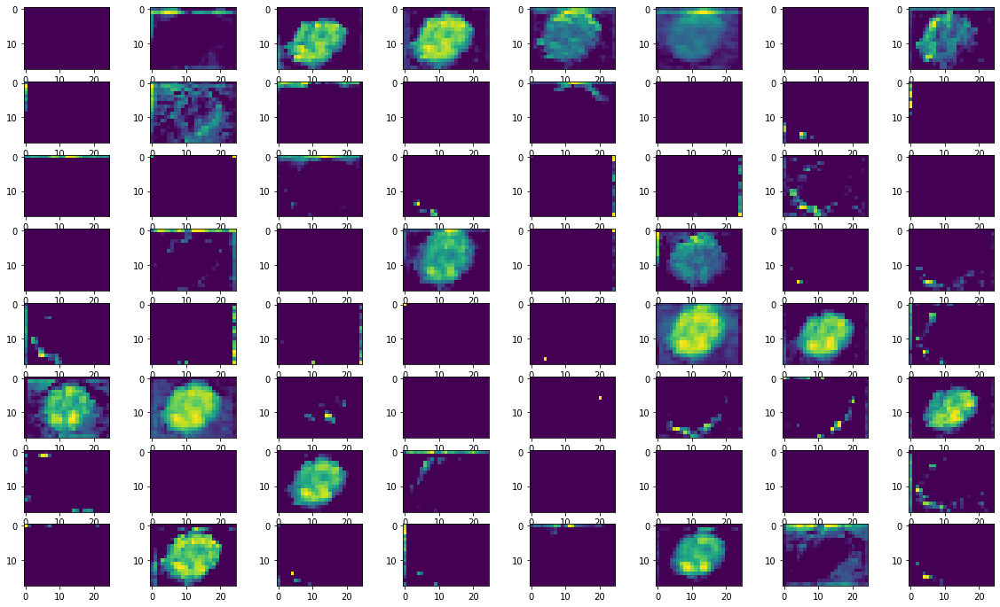

In [63]:
display_activation(activations, 8, 8, 6)

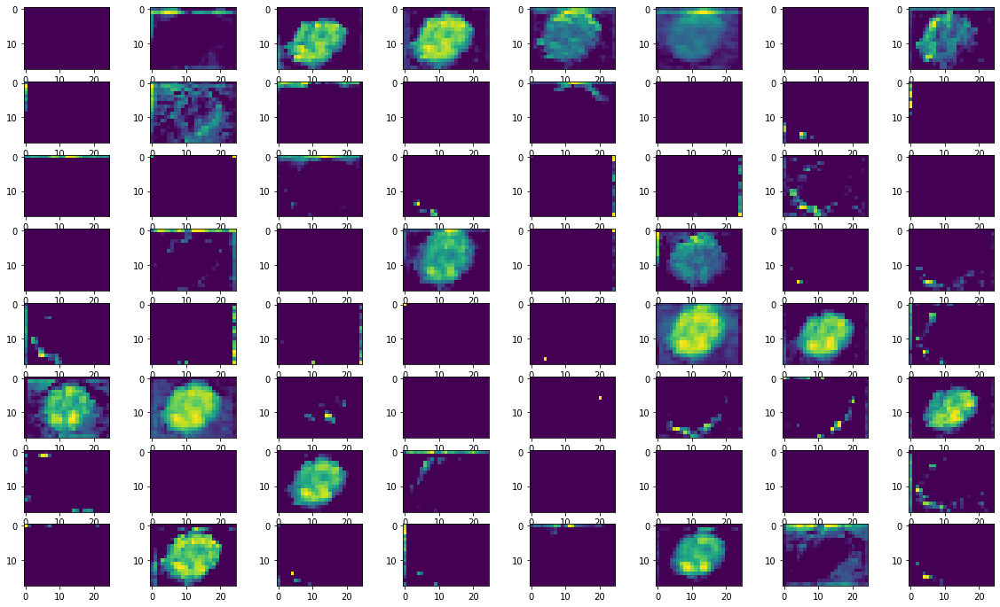

In [64]:
display_activation(activations, 8, 8, 7)

# Confusion Matrix

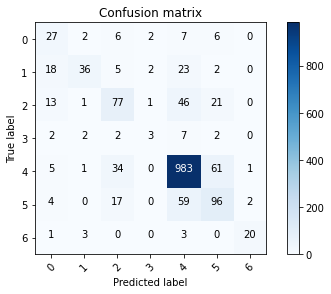

In [65]:
# Function to plot confusion matrix    
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Predict the values from the validation dataset
Y_pred = model.predict(x_validate)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
# Convert validation observations to one hot vectors
Y_true = np.argmax(y_validate,axis = 1) 
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)

 

# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(7)) 

Text(0, 0.5, 'Fraction classified incorrectly')

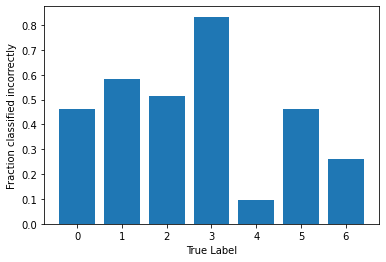

In [66]:
label_frac_error = 1 - np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)
plt.bar(np.arange(7),label_frac_error)
plt.xlabel('True Label')
plt.ylabel('Fraction classified incorrectly')

In [67]:
predictions = model.predict(x_validate)
predictions

array([[8.71393723e-13, 8.14445222e-09, 4.97758066e-08, ...,
        1.00000000e+00, 1.88950349e-08, 6.45825060e-11],
       [3.46930705e-07, 1.64024043e-03, 2.14197953e-05, ...,
        9.98331487e-01, 2.74795070e-06, 3.51930407e-06],
       [8.18916321e-01, 8.22744966e-02, 3.87127027e-02, ...,
        1.86407641e-02, 8.45219707e-04, 5.68405812e-06],
       ...,
       [2.58441831e-14, 1.58739368e-20, 6.41881270e-05, ...,
        9.92587864e-01, 7.34802568e-03, 9.56161231e-18],
       [1.68730594e-06, 9.68391802e-08, 8.25840328e-03, ...,
        6.97024167e-01, 2.94714153e-01, 3.88953993e-07],
       [2.33861530e-09, 7.00900393e-10, 4.38320467e-06, ...,
        9.90822196e-01, 9.17342585e-03, 1.11063985e-08]], dtype=float32)

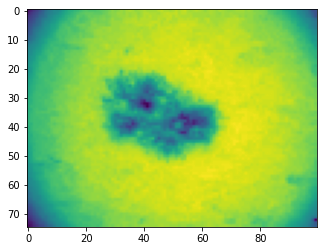

In [76]:
plt.imshow(x_validate[123][:,:,0]);

In [68]:
np.argmax(predictions[0])

4

In [70]:
#install flask-ngrok menggunakan pip
!pip install flask-ngrok

In [95]:
from flask_ngrok import run_with_ngrok
from flask import Flask
from flask import jsonify, request
from werkzeug.utils import secure_filename
import requests
import json
import cv2 as cv

In [96]:
app = Flask(__name__) # Membuat sebuah object Flask
upload_folder = '/content/' #directory tempat penyimpanan gambar yang akan di prediksi
app.config['upload_folder'] = upload_folder

#homepage 
@app.route("/home")
def home(): 
    html="""<html>
    <body>

    <form action="/classify" method="post" enctype="multipart/form-data">
    Pilih Gambar yang akan diprediksi: 
    <input type="file" name="fileToUpload" id="fileToUpload">
    <input type="submit" value="Upload Gambar" name="submit">
    </form>
    </body>
    </html>"""

    return html

In [97]:
@app.route('/classify', methods=['POST'])
def classification():
  file = request.files['fileToUpload']
  if file:
    filename = secure_filename(file.filename)
    file.save(os.path.join(app.config['upload_folder'], filename))

  gambar = cv.imread(upload_folder+filename, 0) #baca data gambar yang di upload
  gambar = gambar.astype('float32') #casting type data gambar menjadi float32
  gambar = gambar / 255.0 #dibagi dengan 255 agar data nya hanya bernilai dari 0-1
  gambar = gambar.reshape(3, 75, 100, 3) #data gambar di reshape menjadi ukuran 75x100 pixel dan berdimensi 3

  model.load_weights('/content/skincancer.h5') #load weights terbaik dari model yang telah kita simpan sebelumnya
  model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy']) #model dijalankan dengan parameter tersebut

  predictions = model.predict(gambar) #proses prediksi terhadap gambar yang kita upload
  result = np.argmax(predictions[0]).tolist()
  
  return jsonify({
      "hasil_prediksi": result
      })

In [98]:
#run app webservice yang dibuat menggunakan ngrok
run_with_ngrok(app) 

app.run()

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


 * Running on http://32e1e11ceb4a.ngrok.io
 * Traffic stats available on http://127.0.0.1:4040


127.0.0.1 - - [15/Oct/2020 12:24:26] "GET / HTTP/1.1" 404 -
127.0.0.1 - - [15/Oct/2020 12:24:28] "GET /favicon.ico HTTP/1.1" 404 -
127.0.0.1 - - [15/Oct/2020 12:24:32] "GET /home HTTP/1.1" 200 -
127.0.0.1 - - [15/Oct/2020 12:25:16] "POST /classify HTTP/1.1" 400 -
[2020-10-15 12:25:36,382] ERROR in app: Exception on /classify [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.6/dist-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.6/dist-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.6/dist-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.6/dist-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request

In [99]:
!pip install -q streamlit

     |████████████████████████████████| 7.4MB 7.7MB/s 
     |████████████████████████████████| 102kB 12.9MB/s 
     |████████████████████████████████| 133kB 58.9MB/s 
     |████████████████████████████████| 112kB 61.9MB/s 
     |████████████████████████████████| 6.7MB 47.8MB/s 
     |████████████████████████████████| 163kB 60.1MB/s 
     |████████████████████████████████| 4.4MB 50.3MB/s 
     |████████████████████████████████| 71kB 10.1MB/s 
     |████████████████████████████████| 71kB 10.6MB/s 
     |████████████████████████████████| 122kB 65.2MB/s 
ERROR: google-colab 1.0.0 has requirement ipykernel~=4.10, but you'll have ipykernel 5.3.4 which is incompatible.


In [ ]:
import streamlit as st
import numpy as np
import pandas as pd
import keras
from keras.utils.np_utils import to_categorical
from keras.models import Sequential, load_model
from keras import backend as K
import os
import time
import io
from PIL import Image
import plotly.express as px

MODELSPATH = './models/'
DATAPATH = './data/'


def render_header():
    st.write("""
        <p align="center"> 
            <H1> Skin cancer Analyzer 
        </p>

    """, unsafe_allow_html=True)


@st.cache
def load_mekd():
    img = Image.open(DATAPATH + '/ISIC_0024312.jpg')
    return img


@st.cache
def data_gen(x):
    img = np.asarray(Image.open(x).resize((100, 75)))
    x_test = np.asarray(img.tolist())
    x_test_mean = np.mean(x_test)
    x_test_std = np.std(x_test)
    x_test = (x_test - x_test_mean) / x_test_std
    x_validate = x_test.reshape(1, 75, 100, 3)

    return x_validate


@st.cache
def data_gen_(img):
    img = img.reshape(100, 75)
    x_test = np.asarray(img.tolist())
    x_test_mean = np.mean(x_test)
    x_test_std = np.std(x_test)
    x_test = (x_test - x_test_mean) / x_test_std
    x_validate = x_test.reshape(1, 75, 100, 3)

    return x_validate


def load_models():

    model = load_model(MODELSPATH + 'model.h5')
    return model


@st.cache
def predict(x_test, model):
    Y_pred = model.predict(x_test)
    ynew = model.predict_proba(x_test)
    K.clear_session()
    ynew = np.round(ynew, 2)
    ynew = ynew*100
    y_new = ynew[0].tolist()
    Y_pred_classes = np.argmax(Y_pred, axis=1)
    K.clear_session()
    return y_new, Y_pred_classes


@st.cache
def display_prediction(y_new):
    """Display image and preditions from model"""

    result = pd.DataFrame({'Probability': y_new}, index=np.arange(7))
    result = result.reset_index()
    result.columns = ['Classes', 'Probability']
    lesion_type_dict = {2: 'Benign keratosis-like lesions', 4: 'Melanocytic nevi', 3: 'Dermatofibroma',
                        5: 'Melanoma', 6: 'Vascular lesions', 1: 'Basal cell carcinoma', 0: 'Actinic keratoses'}
    result["Classes"] = result["Classes"].map(lesion_type_dict)
    return result


def main():
    st.sidebar.header('Skin cancer Analyzer')
    st.sidebar.subheader('Choose a page to proceed:')
    page = st.sidebar.selectbox("", ["Sample Data", "Upload Your Image"])

    if page == "Sample Data":
        st.header("Sample Data Prediction for Skin Cancer")
        st.markdown("""
        *Now, this is probably why you came here. Let's get you some Predictions*

        You need to choose Sample Data
        """)

        mov_base = ['Sample Data I']
        movies_chosen = st.multiselect('Choose Sample Data', mov_base)

        if len(movies_chosen) > 1:
            st.error('Please select Sample Data')
        if len(movies_chosen) == 1:
            st.success("You have selected Sample Data")
        else:
            st.info('Please select Sample Data')

        if len(movies_chosen) == 1:
            if st.checkbox('Show Sample Data'):
                st.info("Showing Sample data---->>>")
                image = load_mekd()
                st.image(image, caption='Sample Data', use_column_width=True)
                st.subheader("Choose Training Algorithm!")
                if st.checkbox('Keras'):
                    model = load_models()
                    st.success("Hooray !! Keras Model Loaded!")
                    if st.checkbox('Show Prediction Probablity on Sample Data'):
                        x_test = data_gen(DATAPATH + '/ISIC_0024312.jpg')
                        y_new, Y_pred_classes = predict(x_test, model)
                        result = display_prediction(y_new)
                        st.write(result)
                        if st.checkbox('Display Probability Graph'):
                            fig = px.bar(result, x="Classes",
                                         y="Probability", color='Classes')
                            st.plotly_chart(fig, use_container_width=True)

    if page == "Upload Your Image":

        st.header("Upload Your Image")

        file_path = st.file_uploader('Upload an image', type=['png', 'jpg'])

        if file_path is not None:
            x_test = data_gen(file_path)
            image = Image.open(file_path)
            img_array = np.array(image)

            st.success('File Upload Success!!')
        else:
            st.info('Please upload Image file')

        if st.checkbox('Show Uploaded Image'):
            st.info("Showing Uploaded Image ---->>>")
            st.image(img_array, caption='Uploaded Image',
                     use_column_width=True)
            st.subheader("Choose Training Algorithm!")
            if st.checkbox('Keras'):
                model = load_models()
                st.success("Hooray !! Keras Model Loaded!")
                if st.checkbox('Show Prediction Probablity for Uploaded Image'):
                    y_new, Y_pred_classes = predict(x_test, model)
                    result = display_prediction(y_new)
                    st.write(result)
                    if st.checkbox('Display Probability Graph'):
                        fig = px.bar(result, x="Classes",
                                     y="Probability", color='Classes')
                        st.plotly_chart(fig, use_container_width=True)


if _name_ == "_main_":
    main()